# * House Price Prediction *

# Problemstatment:- By analyzing these Pune house data we will determine the approximate price for the houses.

# Business Objective and Constraints:--
1. The cost of a mis-classification can be high.
2. There is strict latency concerns.
3. From this project we will able to understand how house prices depend on other factors.

# Importing Libraris

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Reading the Data from the .CSV file

In [2]:
data1=pd.read_csv("C:\\Users\\GANU\\Desktop\\pandas\\Bengaluru_House_Data.csv")
data1

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00
...,...,...,...,...,...,...,...,...,...
13315,Built-up Area,Ready To Move,Whitefield,5 Bedroom,ArsiaEx,3453,4.0,0.0,231.00
13316,Super built-up Area,Ready To Move,Richards Town,4 BHK,NaN,3600,5.0,NaN,400.00
13317,Built-up Area,Ready To Move,Raja Rajeshwari Nagar,2 BHK,Mahla T,1141,2.0,1.0,60.00
13318,Super built-up Area,18-Jun,Padmanabhanagar,4 BHK,SollyCl,4689,4.0,1.0,488.00


In [3]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [4]:
data1['location'].value_counts()

Whitefield                                            540
Sarjapur  Road                                        399
Electronic City                                       302
Kanakpura Road                                        273
Thanisandra                                           234
Yelahanka                                             213
Uttarahalli                                           186
Hebbal                                                177
Marathahalli                                          175
Raja Rajeshwari Nagar                                 171
Bannerghatta Road                                     152
Hennur Road                                           152
7th Phase JP Nagar                                    149
Haralur Road                                          142
Electronic City Phase II                              132
Rajaji Nagar                                          107
Chandapura                                            100
Bellandur     

In [5]:
data1.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


# Exploratory Data Analysis

Printing the shape of the dataframe

In [6]:
data1.shape

(13320, 9)

Total number of columns in the dataset

In [7]:
data1.columns

Index(['area_type', 'availability', 'location', 'size', 'society',
       'total_sqft', 'bath', 'balcony', 'price'],
      dtype='object')

Information about the dataset

In [8]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_type     13320 non-null  object 
 1   availability  13320 non-null  object 
 2   location      13319 non-null  object 
 3   size          13304 non-null  object 
 4   society       7818 non-null   object 
 5   total_sqft    13320 non-null  object 
 6   bath          13247 non-null  float64
 7   balcony       12711 non-null  float64
 8   price         13320 non-null  float64
dtypes: float64(3), object(6)
memory usage: 936.7+ KB


In [9]:
data1['area_type'].unique()

array(['Super built-up  Area', 'Plot  Area', 'Built-up  Area',
       'Carpet  Area'], dtype=object)

In [10]:
data1['location'].unique()

array(['Electronic City Phase II', 'Chikka Tirupathi', 'Uttarahalli', ...,
       '12th cross srinivas nagar banshankari 3rd stage',
       'Havanur extension', 'Abshot Layout'], dtype=object)

In [11]:
data1['size'].unique()

array(['2 BHK', '4 Bedroom', '3 BHK', '4 BHK', '6 Bedroom', '3 Bedroom',
       '1 BHK', '1 RK', '1 Bedroom', '8 Bedroom', '2 Bedroom',
       '7 Bedroom', '5 BHK', '7 BHK', '6 BHK', '5 Bedroom', '11 BHK',
       '9 BHK', nan, '9 Bedroom', '27 BHK', '10 Bedroom', '11 Bedroom',
       '10 BHK', '19 BHK', '16 BHK', '43 Bedroom', '14 BHK', '8 BHK',
       '12 Bedroom', '13 BHK', '18 Bedroom'], dtype=object)

In [12]:
data1['bath'].unique()

array([ 2.,  5.,  3.,  4.,  6.,  1.,  9., nan,  8.,  7., 11., 10., 14.,
       27., 12., 16., 40., 15., 13., 18.])

In [13]:
data1['total_sqft'].unique()

array(['1056', '2600', '1440', ..., '1133 - 1384', '774', '4689'],
      dtype=object)

In [14]:
data1['price'].unique()

array([ 39.07, 120.  ,  62.  , ...,  40.14, 231.  , 488.  ])

To know the description about the dataset

In [15]:
data1.describe()

,bath,balcony,price
count,13247.000000,12711.000000,13320.000000
mean,2.692610,1.584376,112.565627
std,1.341458,0.817263,148.971674
min,1.000000,0.000000,8.000000
25%,2.000000,1.000000,50.000000
50%,2.000000,2.000000,72.000000
75%,3.000000,2.000000,120.000000
max,40.000000,3.000000,3600.000000


In [16]:
data1.describe().T

,count,mean,std,min,25%,50%,75%,max
bath,13247.0,2.692610,1.341458,1.0,2.0,2.0,3.0,40.0
balcony,12711.0,1.584376,0.817263,0.0,1.0,2.0,2.0,3.0
price,13320.0,112.565627,148.971674,8.0,50.0,72.0,120.0,3600.0


Checking if there is some null values or not

In [17]:
data1.isnull()   #data1.isna()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,True,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,True,False,False,False,False
5,False,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,False,True,False
7,False,False,False,False,False,False,False,True,False
8,False,False,False,False,True,False,False,False,False
9,False,False,False,False,True,False,False,True,False


Checking if there is some null values or not (Sum)

In [18]:
data1.isnull().sum()

area_type          0
availability       0
location           1
size              16
society         5502
total_sqft         0
bath              73
balcony          609
price              0
dtype: int64

Performing Group by operation on Area Type

In [19]:
data1.groupby("area_type")["area_type"].agg("count")

area_type
Built-up  Area          2418
Carpet  Area              87
Plot  Area              2025
Super built-up  Area    8790
Name: area_type, dtype: int64

In [20]:
for column in data1.columns:
    print(data1[column].value_counts())
    print("*"*20)

Super built-up  Area    8790
Built-up  Area          2418
Plot  Area              2025
Carpet  Area              87
Name: area_type, dtype: int64
********************
Ready To Move           10581
18-Dec                    307
18-May                    295
18-Apr                    271
18-Aug                    200
19-Dec                    185
18-Jul                    143
18-Mar                    131
18-Jun                     99
20-Dec                     98
21-Dec                     93
19-Mar                     88
18-Feb                     62
18-Nov                     47
18-Jan                     43
18-Sep                     41
19-Jun                     40
19-Jan                     39
18-Oct                     39
19-Jul                     36
17-Dec                     29
20-Jan                     24
19-Sep                     21
17-Oct                     21
22-Jun                     19
19-Aug                     18
21-Jun                     17
20-Aug                 

75.000      310
65.000      302
55.000      275
60.000      270
45.000      240
50.000      235
70.000      208
90.000      203
85.000      201
110.000     185
80.000      185
150.000     180
95.000      177
100.000     177
120.000     169
40.000      167
125.000     161
130.000     134
58.000      133
48.000      127
42.000      124
35.000      123
56.000      121
46.000      119
52.000      116
115.000     116
68.000      110
140.000     110
160.000     106
62.000      103
200.000     103
78.000       91
57.000       86
72.000       86
105.000      84
135.000      84
47.000       82
180.000      82
44.000       80
250.000      74
300.000      72
38.000       72
53.000       70
67.000       67
170.000      67
88.000       67
69.000       66
39.000       65
59.000       65
36.000       63
54.000       63
145.000      63
175.000      61
66.000       60
49.000       60
240.000      60
63.000       57
41.000       56
32.000       56
43.000       54
98.000       54
30.000       53
82.000  

Checking what different "Area Types" are present in the Dataset

# Data Visualization

<AxesSubplot:>

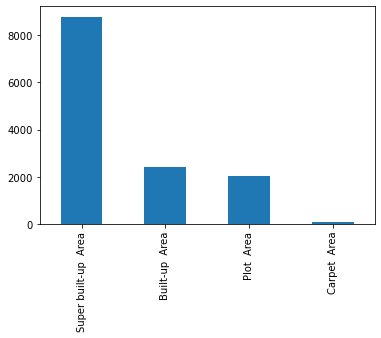

In [21]:
data1.area_type.value_counts().plot(kind='bar')

In [22]:
data1['bath'].unique()

array([ 2.,  5.,  3.,  4.,  6.,  1.,  9., nan,  8.,  7., 11., 10., 14.,
       27., 12., 16., 40., 15., 13., 18.])

<AxesSubplot:>

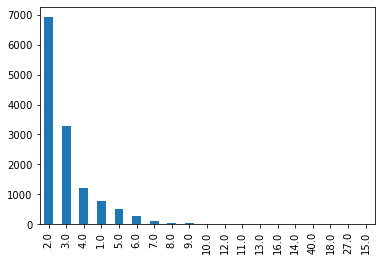

In [23]:
data1.bath.value_counts().plot(kind='bar')

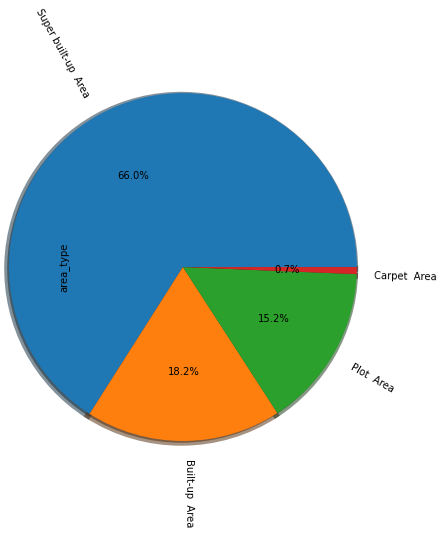

In [24]:
(data1["area_type"].value_counts()).plot.pie(autopct="%.1f%%", shadow=True,rotatelabels=True, wedgeprops={'linewidth': 6}, radius=2)
plt.show()

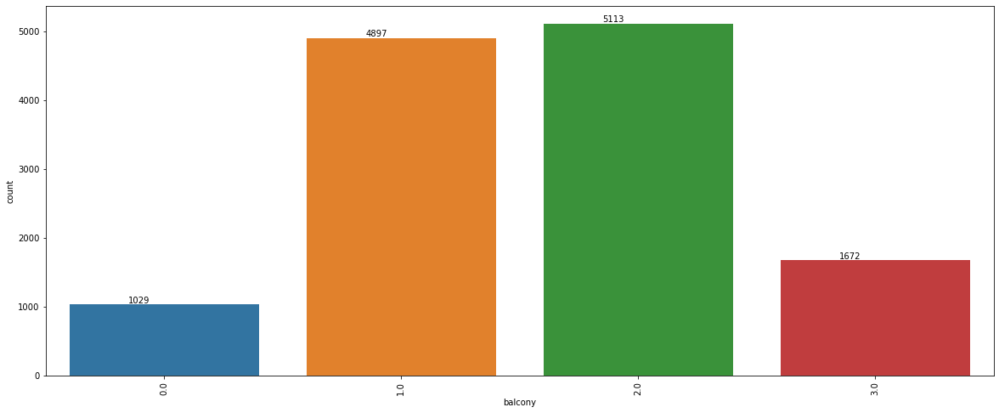

In [25]:
plt.figure(figsize = (20,8))
ax=sns.countplot(x = 'balcony', data = data1)
plt.xticks(rotation = 90)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x()+0.25, p.get_height()+1), va = 'bottom', color = 'black')

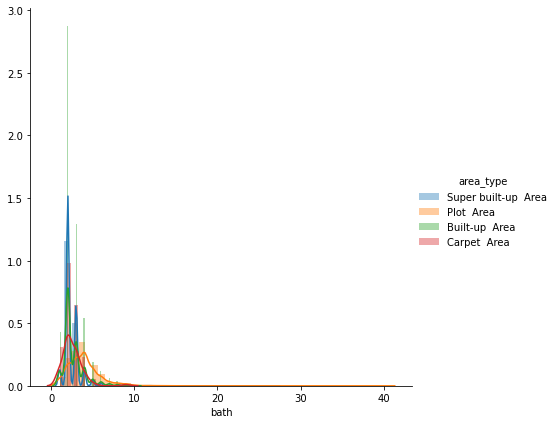

In [26]:
import warnings
warnings.filterwarnings('ignore')

sns.FacetGrid(data1, hue='area_type', height=6).map(sns.distplot, 'bath').add_legend()
plt.show()

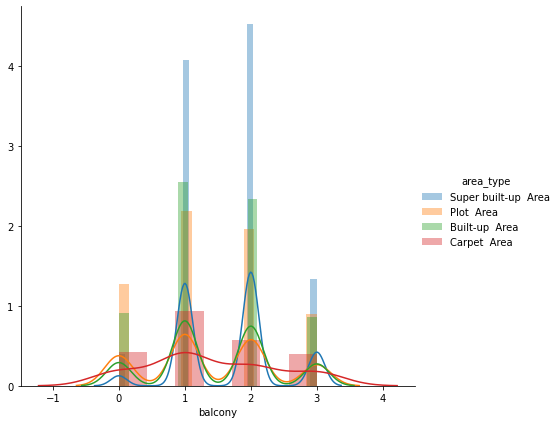

In [27]:
sns.FacetGrid(data1, hue='area_type', height=6).map(sns.distplot, 'balcony').add_legend()
plt.show()

# Dropping less important features

In [28]:
#data1 = data1.drop(['area_type','availability','society','balcony'],axis = 'columns')
data1.drop(columns=['area_type','availability','society','balcony'],inplace=True)

In [29]:
data1.shape

(13320, 5)

In [30]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   location    13319 non-null  object 
 1   size        13304 non-null  object 
 2   total_sqft  13320 non-null  object 
 3   bath        13247 non-null  float64
 4   price       13320 non-null  float64
dtypes: float64(2), object(3)
memory usage: 520.4+ KB


In [31]:
data1['location'].value_counts()

Whitefield                                            540
Sarjapur  Road                                        399
Electronic City                                       302
Kanakpura Road                                        273
Thanisandra                                           234
Yelahanka                                             213
Uttarahalli                                           186
Hebbal                                                177
Marathahalli                                          175
Raja Rajeshwari Nagar                                 171
Bannerghatta Road                                     152
Hennur Road                                           152
7th Phase JP Nagar                                    149
Haralur Road                                          142
Electronic City Phase II                              132
Rajaji Nagar                                          107
Chandapura                                            100
Bellandur     

In [32]:
data1['location']=data1['location'].fillna('sarjapur read')

In [33]:
data1['size'].value_counts()

2 BHK         5199
3 BHK         4310
4 Bedroom      826
4 BHK          591
3 Bedroom      547
1 BHK          538
2 Bedroom      329
5 Bedroom      297
6 Bedroom      191
1 Bedroom      105
8 Bedroom       84
7 Bedroom       83
5 BHK           59
9 Bedroom       46
6 BHK           30
7 BHK           17
1 RK            13
10 Bedroom      12
9 BHK            8
8 BHK            5
11 BHK           2
10 BHK           2
11 Bedroom       2
13 BHK           1
14 BHK           1
19 BHK           1
43 Bedroom       1
27 BHK           1
12 Bedroom       1
18 Bedroom       1
16 BHK           1
Name: size, dtype: int64

In [34]:
data1['size']=data1['size'].fillna('2 BHK')

In [35]:
data1['bath'] = data1['bath'].fillna(data1['bath'].median())

In [36]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   location    13320 non-null  object 
 1   size        13320 non-null  object 
 2   total_sqft  13320 non-null  object 
 3   bath        13320 non-null  float64
 4   price       13320 non-null  float64
dtypes: float64(2), object(3)
memory usage: 520.4+ KB


# Dropping null values
data1 = data1.dropna() /
data1.isnull().sum()  /
data1.shape

In [37]:
data1['bhk']=data1['size'].str.split().str.get(0).astype(int)

In [38]:
#data1['bhk'] = df["size"].apply(lambda x: int(x.split(" ")[0]))
#bhk.head()

In [39]:
data1[data1.bhk>20]

,location,size,total_sqft,bath,price,bhk
1718,2Electronic City Phase II,27 BHK,8000,27.0,230.0,27
4684,Munnekollal,43 Bedroom,2400,40.0,660.0,43


Applying unique function on feature called Size

In [40]:
data1['size'].unique()

array(['2 BHK', '4 Bedroom', '3 BHK', '4 BHK', '6 Bedroom', '3 Bedroom',
       '1 BHK', '1 RK', '1 Bedroom', '8 Bedroom', '2 Bedroom',
       '7 Bedroom', '5 BHK', '7 BHK', '6 BHK', '5 Bedroom', '11 BHK',
       '9 BHK', '9 Bedroom', '27 BHK', '10 Bedroom', '11 Bedroom',
       '10 BHK', '19 BHK', '16 BHK', '43 Bedroom', '14 BHK', '8 BHK',
       '12 Bedroom', '13 BHK', '18 Bedroom'], dtype=object)

In [41]:
data1.head()

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.00,4
2,Uttarahalli,3 BHK,1440,2.0,62.00,3
3,Lingadheeranahalli,3 BHK,1521,3.0,95.00,3
4,Kothanur,2 BHK,1200,2.0,51.00,2


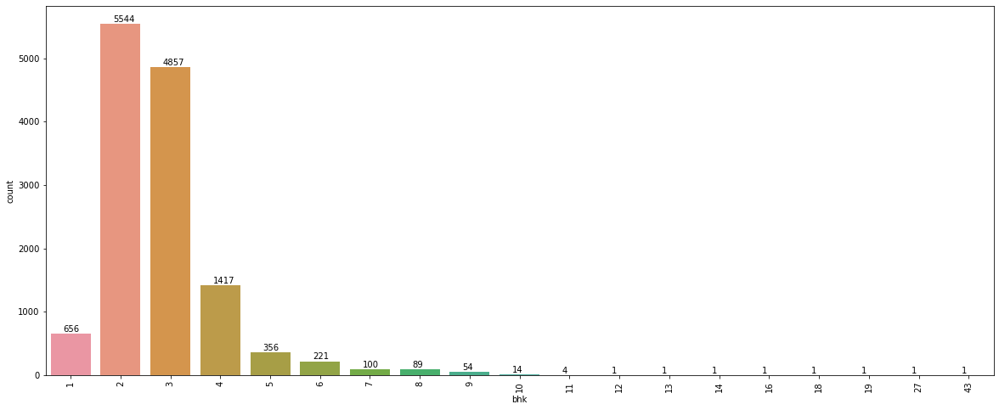

In [42]:
plt.figure(figsize = (20,8))
ax=sns.countplot(x = 'bhk', data = data1)
plt.xticks(rotation = 90)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x()+0.25, p.get_height()+1), va = 'bottom', color = 'black')

In [43]:
data1['total_sqft'].unique()

array(['1056', '2600', '1440', ..., '1133 - 1384', '774', '4689'],
      dtype=object)

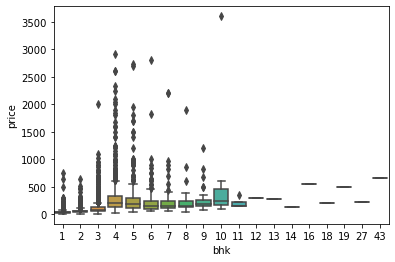

In [44]:
sns.boxplot(x = 'bhk', y = 'price', data = data1)
plt.show()

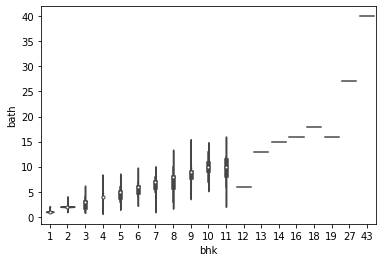

In [45]:
sns.violinplot(x='bhk', y = 'bath', data = data1)
plt.show()

Exploring total_sqft feature    /    
Converting Sq.Ft to Number

In [46]:
def convertRange(x):
    temp = x.split('-')
    if len(temp) == 2:
        return (float(temp[0]) + float(temp[1]))/2
    try:
        return float(x)
    except:
        return None
            

In [47]:
data1['total_sqft'] = data1['total_sqft'].apply(convertRange)
data1.head()

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3
4,Kothanur,2 BHK,1200.0,2.0,51.00,2


In [48]:
data1.head(10)

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3
4,Kothanur,2 BHK,1200.0,2.0,51.00,2
5,Whitefield,2 BHK,1170.0,2.0,38.00,2
6,Old Airport Road,4 BHK,2732.0,4.0,204.00,4
7,Rajaji Nagar,4 BHK,3300.0,4.0,600.00,4
8,Marathahalli,3 BHK,1310.0,3.0,63.25,3
9,Gandhi Bazar,6 Bedroom,1020.0,6.0,370.00,6


In [49]:
# def is_float(x):
 #   try:
  #     return False
   # return True

In [50]:
# data1[~data1["total_sqft"].apply(is_float)].head(10)

# price per square feet:

Here, we are adding a new feature called Price per Square Feet

In [51]:
data1['price_per_sqft'] = data1['price'] *100000 / data1['total_sqft']

In [52]:
data1['price_per_sqft']
data1.head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699.810606
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615.384615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305.555556
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245.890861
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250.000000


In [53]:
data1.describe()

,total_sqft,bath,price,bhk,price_per_sqft
count,13274.000000,13320.000000,13320.000000,13320.000000,1.327400e+04
mean,1559.626694,2.688814,112.565627,2.802778,7.907501e+03
std,1238.405258,1.338754,148.971674,1.294496,1.064296e+05
min,1.000000,1.000000,8.000000,1.000000,2.678298e+02
25%,1100.000000,2.000000,50.000000,2.000000,4.266865e+03
50%,1276.000000,2.000000,72.000000,3.000000,5.434306e+03
75%,1680.000000,3.000000,120.000000,3.000000,7.311746e+03
max,52272.000000,40.000000,3600.000000,43.000000,1.200000e+07


Here, we are going to use Dimentionality Reduction for the data which are categorical variable. We need to apply Dimensionality Reduction here to reduce number of locations.

In [54]:
data1.location = data1.location.apply(lambda x: x.strip())
location_counts = data1['location'].value_counts(ascending=False)
location_counts

Whitefield                                            541
Sarjapur  Road                                        399
Electronic City                                       304
Kanakpura Road                                        273
Thanisandra                                           237
Yelahanka                                             213
Uttarahalli                                           186
Hebbal                                                177
Marathahalli                                          175
Raja Rajeshwari Nagar                                 171
Hennur Road                                           152
Bannerghatta Road                                     152
7th Phase JP Nagar                                    149
Haralur Road                                          142
Electronic City Phase II                              132
Rajaji Nagar                                          107
Chandapura                                            100
Bellandur     

In [55]:
len(location_counts [location_counts <=10])

1054

In [56]:
location_count_less_10 = location_counts[location_counts<=10]
location_count_less_10

Kalkere                                               10
BTM 1st Stage                                         10
Dodsworth Layout                                      10
Nagappa Reddy Layout                                  10
Dairy Circle                                          10
Sadashiva Nagar                                       10
1st Block Koramangala                                 10
Ganga Nagar                                           10
Naganathapura                                         10
Nagadevanahalli                                       10
Basapura                                              10
Sector 1 HSR Layout                                   10
Gunjur Palya                                          10
Volagerekallahalli                                     9
Chennammana Kere                                       9
Yemlur                                                 9
2nd Phase JP Nagar                                     9
B Narayanapura                 

In [57]:
data1['location']=data1['location'].apply(lambda x: 'other' if x in location_count_less_10 else x)
len(data1.location.unique())

242

In [58]:
data1.head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699.810606
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615.384615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305.555556
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245.890861
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250.000000


In [59]:
data1['location'].value_counts()

other                          2886
Whitefield                      541
Sarjapur  Road                  399
Electronic City                 304
Kanakpura Road                  273
Thanisandra                     237
Yelahanka                       213
Uttarahalli                     186
Hebbal                          177
Marathahalli                    175
Raja Rajeshwari Nagar           171
Hennur Road                     152
Bannerghatta Road               152
7th Phase JP Nagar              149
Haralur Road                    142
Electronic City Phase II        132
Rajaji Nagar                    107
Chandapura                      100
Bellandur                        96
KR Puram                         91
Electronics City Phase 1         88
Hoodi                            88
Yeshwanthpur                     85
Begur Road                       84
Sarjapur                         82
Kasavanhalli                     80
Harlur                           79
Banashankari                

Here we will discard some more data. Because, normally if a square ft per bedroom is 300 (i.e. 2 bhk apartment is minimum 600 sqft. If you have for example 400 sqft apartment with 2 bhk than that seems suspicious and can be removed as an outlier. We will remove such outliers by keeping our minimum thresold per bhk to be 300 sqft

In [60]:
(data1['total_sqft']/data1['bhk']).describe()

count    13274.000000
mean       575.074878
std        388.205175
min          0.250000
25%        473.333333
50%        552.500000
75%        625.000000
max      26136.000000
dtype: float64

In [61]:
data1.head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699.810606
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615.384615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305.555556
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245.890861
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250.000000


In [62]:
data1 = data1[((data1['total_sqft']/data1['bhk'])>= 300)]

In [63]:
data1.describe()

,total_sqft,bath,price,bhk,price_per_sqft
count,12530.000000,12530.000000,12530.000000,12530.000000,12530.000000
mean,1594.564544,2.559537,111.382401,2.650838,6303.979357
std,1261.271296,1.077938,152.077329,0.976678,4162.237981
min,300.000000,1.000000,8.440000,1.000000,267.829813
25%,1116.000000,2.000000,49.000000,2.000000,4210.526316
50%,1300.000000,2.000000,70.000000,3.000000,5294.117647
75%,1700.000000,3.000000,115.000000,3.000000,6916.666667
max,52272.000000,16.000000,3600.000000,16.000000,176470.588235


In [64]:
data1.shape

(12530, 7)

In [65]:
data1.price_per_sqft.describe()

count     12530.000000
mean       6303.979357
std        4162.237981
min         267.829813
25%        4210.526316
50%        5294.117647
75%        6916.666667
max      176470.588235
Name: price_per_sqft, dtype: float64

Here we find that min price per sqft is 267 rs/sqft whereas max is 12000000, this shows a wide variation in property prices. We should remove outliers per location using mean and one Standard Deviation

In [66]:
def remove_outliers_sqft(df):
    df_output = pd.DataFrame()
    for key,subdf in df.groupby('location'):
        m = np.mean(subdf.price_per_sqft)
        
        st = np.std(subdf.price_per_sqft)
        
        gen_df = subdf[(subdf.price_per_sqft >(m-st)) & (subdf.price_per_sqft <= (m+st))]
        df_output = pd.concat([df_output,gen_df],ignore_index = True)
    return df_output
data1 = remove_outliers_sqft(data1)
data1.describe()

,total_sqft,bath,price,bhk,price_per_sqft
count,10301.000000,10301.000000,10301.000000,10301.000000,10301.000000
mean,1508.440608,2.471702,91.286372,2.574896,5659.062876
std,880.694214,0.979449,86.342786,0.897649,2265.774749
min,300.000000,1.000000,10.000000,1.000000,1250.000000
25%,1110.000000,2.000000,49.000000,2.000000,4244.897959
50%,1286.000000,2.000000,67.000000,2.000000,5175.600739
75%,1650.000000,3.000000,100.000000,3.000000,6428.571429
max,30400.000000,16.000000,2200.000000,16.000000,24509.803922


In [67]:
data1.shape

(10301, 7)

Ploting the Scatter Chart for 2 BHK and 3 BHK properties

In [68]:
def bhk_outlier_remover(df):
    exclude_indices = np.array([])
    for location, location_df in df.groupby('location'):
        bhk_stats = {}
        for bhk, bhk_df in location_df.groupby('bhk'):
            bhk_stats[bhk] = {
                'mean': np.mean(bhk_df.price_per_sqft),
                'std': np.std(bhk_df.price_per_sqft),
                'count': bhk_df.shape[0]
            }
    for bhk, bhk_df in location_df.groupby('bhk'):
        stats = bhk_stats.get(bhk-1)
        if stats and stats['count']>5:
            exclude_indices = np.append(exclude_indices, bhk_df[bhk_df.price_per_sqft<(stats['mean'])].index.values)
    return df.drop(exclude_indices,axis='index')

In [69]:
data1=bhk_outlier_remover(data1)

In [70]:
data1.shape

(9150, 7)

In [71]:
data1

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,1st Block Jayanagar,4 BHK,2850.000,4.0,428.000,4,15017.543860
1,1st Block Jayanagar,3 BHK,1630.000,3.0,194.000,3,11901.840491
2,1st Block Jayanagar,3 BHK,1875.000,2.0,235.000,3,12533.333333
3,1st Block Jayanagar,3 BHK,1200.000,2.0,130.000,3,10833.333333
4,1st Block Jayanagar,2 BHK,1235.000,2.0,148.000,2,11983.805668
5,1st Block Jayanagar,4 BHK,2750.000,4.0,413.000,4,15018.181818
6,1st Block Jayanagar,4 BHK,2450.000,4.0,368.000,4,15020.408163
7,1st Phase JP Nagar,4 BHK,2825.000,4.0,250.000,4,8849.557522
8,1st Phase JP Nagar,3 BHK,1875.000,3.0,167.000,3,8906.666667
9,1st Phase JP Nagar,5 Bedroom,1500.000,5.0,85.000,5,5666.666667


In [72]:
data1.drop(columns=['size','price_per_sqft'],inplace=True)

In [73]:
data1.head()

,location,total_sqft,bath,price,bhk
0,1st Block Jayanagar,2850.0,4.0,428.0,4
1,1st Block Jayanagar,1630.0,3.0,194.0,3
2,1st Block Jayanagar,1875.0,2.0,235.0,3
3,1st Block Jayanagar,1200.0,2.0,130.0,3
4,1st Block Jayanagar,1235.0,2.0,148.0,2


In [74]:
#regression ploting using seaaborn
#flg=plt.figure(figsize=(15,15))
#sns.regplot(x=data1['location'],y=data1['price'],color='blue',marker='+')
#sns.regplot(x=data1['total_sqft'],y=data1['price'],color='magenta',marker='o')
#sns.regplot(x=data1['bath'],y=data1['price'],color='red',marker='*')
#sns.regplot(x=data1['bhk'],y=data1['price'],color='pink',marker='#')

#legent title and labels
#plt.legend(labels=['location','total_sqft','bath','bhk'])
#plt.title('relationship between location,total_sqft,bath,bhk and price',size=24)
#plt.xlabel('location,total_sqft,bath,bhk',size=18)
#plt.ylabel('price',size=18)

In [75]:
data1.to_csv('Cleaned_data.csv')

In [76]:
df=pd.read_csv("C:\\Users\\GANU\\Desktop\\pandas\\Cleaned_data.csv")
#df
    
x=df.iloc[:,1:4]
y=df.iloc[:,4]
    #x
    #y
    

    
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=2)
    #print("total no of i/p and o/p record training: ",(x_train.shape),(y_train.shape))
    #print("total no of i/p and o/p record testing: ",(y_test.shape),(y_test.shape))
    
from sklearn.linear_model import LinearRegression
model=LinearRegression()
model.fit(x_train,y_train)


print(model.intercept_)
print(model.coef_)




    
y_pred=model.predict(x_test)
import pickle
pickle.dump(model, open('lrm.pkl','wb'))

-36.59129903110204
[ 0.08726606  8.55468378 -8.3660596 ]


In [77]:
df

,location,total_sqft,bath,bhk,price
0,1st Block Jayanagar,2850.000,4,4,428.000
1,1st Block Jayanagar,1630.000,3,3,194.000
2,1st Block Jayanagar,1875.000,2,3,235.000
3,1st Block Jayanagar,1200.000,2,3,130.000
4,1st Block Jayanagar,1235.000,2,2,148.000
5,1st Block Jayanagar,2750.000,4,4,413.000
6,1st Block Jayanagar,2450.000,4,4,368.000
7,1st Phase JP Nagar,2825.000,4,4,250.000
8,1st Phase JP Nagar,1875.000,3,3,167.000
9,1st Phase JP Nagar,1500.000,5,5,85.000


In [78]:
# Ridge and lasso

In [102]:
x=data1.drop(columns=['price'])
y=data1['price']

In [103]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.preprocessing import OneHotEncoder,StandardScaler
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score

In [104]:
x_train,x_test,y_train,y_test=train_test_split(x,y, test_size=0.2, random_state=0)
print(x_train.shape)
print(x_test.shape)

(7320, 4)
(1830, 4)


# apply linear regression

In [105]:
column_trans = make_column_transformer((OneHotEncoder(sparse=False),['location']),remainder='passthrough')

In [106]:
scaler = StandardScaler()

In [107]:
lr=LinearRegression(normalize=True)

In [108]:
pipe = make_pipeline(column_trans,scaler,lr)

In [109]:
pipe.fit(x_train,y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['location'])])),
                ('standardscaler', StandardScaler()),
                ('linearregression', LinearRegression(normalize=True))])

In [123]:
x_test

,location,total_sqft,bath,bhk
5456,Panathur,1198.000,2.0,2
5792,Rajaji Nagar,1357.000,2.0,2
2860,Hebbal,2790.000,4.0,4
1940,Electronic City,1128.000,2.0,2
9138,other,1740.000,3.0,3
9254,other,1044.000,2.0,2
1067,Begur Road,1160.000,2.0,2
2384,Frazer Town,4856.000,5.0,4
5617,Raja Rajeshwari Nagar,1128.000,2.0,2
831,Bannerghatta Road,1640.000,2.0,3


In [121]:
y_pred_lr = pipe.predict(x_test)

In [122]:
y_pred_lr

array([ 73.13741362, 239.46798003, 210.28048003, ...,  61.61299956,
        57.81075347,  75.48506987])

In [128]:
cb=pd.DataFrame({'location':['other'],'total_sqft':[5000],'bath':[1],'bhk':[2]})

In [130]:
cb

,location,total_sqft,bath,bhk
0,other,5000,1,2


In [131]:
pipe.predict(cb)

array([395.97969878])

In [132]:
pickle.dump(pipe, open('finallr.pkl','wb'))

In [111]:
r2_score(y_test,y_pred_lr)

0.8218907026136792

# apply Lasso

In [89]:
lasso = Lasso()

In [90]:
pipe = make_pipeline(column_trans,scaler,lasso)

In [91]:
pipe.fit(x_train,y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['location'])])),
                ('standardscaler', StandardScaler()), ('lasso', Lasso())])

In [ ]:
pipe

In [92]:
y_pred_lasso = pipe.predict(x_test)

In [93]:
r2_score(y_test,y_pred_lasso)

0.8166405265884518

# apply Ridge

In [94]:
ridge = Ridge()

In [95]:
pipe = make_pipeline(column_trans,scaler,ridge)

In [96]:
pipe.fit(x_train,y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['location'])])),
                ('standardscaler', StandardScaler()), ('ridge', Ridge())])

In [97]:
y_pred_ridge = pipe.predict(x_test)

In [98]:
r2_score(y_test,y_pred_ridge)

0.8219181780623154

In [99]:
print("No Regularization : ", r2_score(y_test,y_pred_lr))
print("Lasso : ", r2_score(y_test,y_pred_lasso))
print("Ridge : ", r2_score(y_test,y_pred_ridge))

No Regularization :  0.8218907026136792
Lasso :  0.8166405265884518
Ridge :  0.8219181780623154


In [100]:
import pickle

In [101]:
pickle.dump(pipe, open('RidgeModel.pkl','wb'))